# Packages Required

In [46]:
import pandas as pd
import numpy as np
import re
import pprint
from collections import defaultdict

import string
from string import punctuation

import os

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly as py
import plotly.graph_objs as go
init_notebook_mode(connected=True)

import gensim
from gensim import corpora, models, similarities

import nltk
from nltk.corpus import stopwords
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
wordnet_lemmatizer = WordNetLemmatizer()

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

# Time conversion of Tweets  

In [75]:
tweets = pd.read_csv(r'C:\Users\Luca Nannini\Desktop/TweetsClean.csv')
tweet = tweets[tweets['RT'] == False]
tweet

,text,created_at,geo,lang,place,coordinates,user.favourites_count,user.statuses_count,user.description,user.location,...,CandidateSpeaking,TimeTurn,Interruption,Clinton,Trump,PolDebate,TrumpSupport,ClintonSupport,TrumpSupporter,ClintonSupporter
0,"Hold on to your ass, hug your loved ones tight...",2016-09-27T01:04:53Z,NaN,en,Place(_api=<tweepy.api.API object at 0x108c158...,NaN,1711,175221,"Montrealer back home from NZ (?). Husband, fat...","Montreal, Quebec, Canada",...,Clinton:,0.4,No,1,0,0,0,0,0,0
2,It's time to Watch Trump destroy Secretary Cli...,2016-09-27T01:04:53Z,NaN,en,NaN,NaN,156653,156309,NaN,NaN,...,Clinton:,0.4,No,1,1,0,0,0,0,0
4,Drink every time Trump says huge folks #debate...,2016-09-27T01:04:53Z,NaN,en,NaN,NaN,2073,6948,CoFounder / Product Designer at Lay Waste Game...,Cambridge MA,...,Clinton:,0.4,No,0,1,1,0,0,0,0
6,This debate is going to get nasty real quick.,2016-09-27T01:04:53Z,NaN,en,NaN,NaN,14873,13693,| Business | Finance | Investing | Politics |N...,"Flint, Michigan",...,Clinton:,0.4,No,0,0,1,0,0,0,0
7,DEBATE TIME!!!!\nLETS GOOOOO!!,2016-09-27T01:04:53Z,NaN,en,NaN,NaN,10714,5024,NaN,New York,...,Clinton:,0.4,No,0,0,0,0,0,0,0
8,"On the one hand, America is a land of almost l...",2016-09-27T01:04:53Z,NaN,en,NaN,NaN,8880,5741,Producer @cvnt_cntrvrsy / Personnel @faimissio...,Iraq,...,Clinton:,0.4,No,0,1,1,0,0,0,0
10,@millasauntie12 @realdonaldtrump is gonna dest...,2016-09-27T01:04:53Z,NaN,en,NaN,NaN,67,800,NaN,NaN,...,Clinton:,0.4,No,0,1,1,0,0,0,0
12,Been 15 months since I went to a Donald Trump ...,2016-09-27T01:04:53Z,NaN,en,NaN,NaN,7259,6817,Asst. Editor @DOSports. past: @ringer. aspirin...,sam.fortier7@gmail,...,Clinton:,0.4,No,0,1,0,0,0,0,0
13,lol watching the debate with my parents as the...,2016-09-27T01:04:53Z,NaN,en,NaN,NaN,15268,41563,i am loving being alive and i am being alive l...,somewhere w/ a bottle of vodka,...,Clinton:,0.4,No,0,1,1,0,0,0,0
14,Watching this debate 👀,2016-09-27T01:04:53Z,NaN,en,NaN,NaN,408,50343,•KEN-NÉE-YAH•,NaN,...,Clinton:,0.4,No,0,0,1,0,0,0,0


In [76]:
#import datetime
from datetime import datetime
from datetime import timedelta

clean_timestamp =  tweet['created_at'].apply(lambda x: datetime.strptime(x,'%Y-%m-%dT%H:%M:%SZ'))
#offset in hours for EST timezone
offset_hours = -16
#account for offset from UTC using timedelta                                
local_timestamp = clean_timestamp + timedelta(hours=offset_hours)  

In [77]:
final_timestamp = local_timestamp.dt.strftime('%X')

In [78]:
#create a new dataframe with the new time format and tweets text
TIME = final_timestamp
TEXT = tweet['text']
new_tweet = pd.DataFrame(dict(TIME = TIME, TEXT = TEXT))
new_tweet.set_index("TIME", inplace= True)

In [51]:
new_tweet

,TEXT
TIME,
09:04:53,"Hold on to your ass, hug your loved ones tight..."
09:04:53,It's time to Watch Trump destroy Secretary Cli...
09:04:53,Drink every time Trump says huge folks #debate...
09:04:53,This debate is going to get nasty real quick.
09:04:53,DEBATE TIME!!!!\nLETS GOOOOO!!
09:04:53,"On the one hand, America is a land of almost l..."
09:04:53,@millasauntie12 @realdonaldtrump is gonna dest...
09:04:53,Been 15 months since I went to a Donald Trump ...
09:04:53,lol watching the debate with my parents as the...


# Overall tweet volume & tweets LDA 

### Tweet Volume graph

#NB. In order to visualize the tweet volume, the TIME column must be moved away as index. 
BUT for sub-chunk the new_tweet dataframe function should not be run.
Then, for the following segments analysis section do RUN AGAIN the entire time conversion section obtaining again the original "new_tweet" dataframe.

In [52]:
new_tweet.reset_index(inplace= True)

In [53]:
tweets_ratio = pd.to_datetime(new_tweet['TIME'], format='%X')

trace = go.Histogram(
    x=tweets_ratio,
    marker=dict(
        color='lightblue'
    ),
    opacity=0.75
)

layout = go.Layout(
    title='Overall Debate',
    height=450,
    width=1200,
    xaxis=dict(
        title='Time Segment for each bar = 29sec'
    ),
    yaxis=dict(
        title='Tweet Volume'
    ),
    bargap=0.2,
)

data = [trace]

fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig)

### Tweets LDA 

In [54]:
tweets = list(new_tweet.TEXT)

twtok = [
     [word for word in document.lower().split()]
      for document in tweets
 ]

# remove words that appear only once
frequency = defaultdict(int)
for text in twtok:
     for token in text:
        frequency[token] += 1
        
debtok = [
     [token for token in text if frequency[token] > 1]
     for text in twtok
 ]

In [55]:
tweets = [list(filter(None, [re.sub(r'\b\w{1,2}\b','', x) for x in y])) for y in
       debtok]
tweets = [list(filter(None, [re.sub(r'\d+','', x) for x in y])) for y in
       tweets]
tweets = [list(filter(None, [re.sub(r'(@[A-Za-z0-9]+)','', x) for x in y])) for y in
       tweets]
tweets = [list(filter(None, [re.sub(r'[\.\,\'\"\!\?\:\;\-\_\/\=\(\)\|\*\&\@\#\$\"]+','', x) for x in y])) for y in
       tweets]
tweets = [list(filter(None, [re.sub(r'[^\x00-\x7F]+','', x) for x in y])) for y in
       tweets]
tweets = [list(filter(None, [re.sub(r'(.)\1{2,}',r'\1', x) for x in y])) for y in
       tweets]

In [56]:
stoplist1 = ['hillary','clinton','trump','donald','debatenight','debate','people','want','know','believe','you','really','lot','tell','young','stopandfrisk','that','get','got','much','many','put','kind','thanks','thank','think','well','nobody','take','taken','taking','going','go','things','maybe','something','yes','way','would','could','actually','almost','see','seen','sean','called','thing','let','done','went','say','whether','said','look','one','like','also','good','new','ever','little','cannot','everything','lester','even','hannity'] + list(stoplist)

In [57]:
lmtzr = WordNetLemmatizer()
stoplist = stopwords.words('english')
cleaned_tweets = [
     [lmtzr.lemmatize(word) for word in document if word not in stoplist1]
    for document in tweets
 ]

In [58]:
cleaned_tweets

[['hold', 'as', 'hug', 'loved', 'one', 'tight', 'hope', 'hrc', 'take'],
 ['time', 'watch', 'destroy', 'secretary', 'close', 'back', 'country', 'yeah'],
 ['drink', 'every', 'time', 'say', 'huge', 'folk', 'presidentialdebate'],
 ['nasty', 'real', 'quick'],
 ['time', 'let'],
 ['hand', 'america', 'land', 'hand', 'kid', 'line', 'stage'],
 ['gonna', 'destroy', 'tonight', 'everyone', 'trumptrain'],
 ['month', 'since', 'rally', 'laugh', 'crowd'],
 ['lol', 'watching', 'parent', 'support', 'gonna', 'fun'],
 ['watching'],
 ['bart', 'simpson', 'lisa', 'simpson', 'tonight'],
 ['gonna', 'interesting'],
 ['tune', 'first', 'presidential', 'tonight', 'crooked'],
 ['come', 'imwithher'],
 ['pretty', 'surreal', 'remember', 'american'],
 [],
 ['watching', 'via', 'whatatimetobealive'],
 ['wizard',
  'need',
  'show',
  'brain',
  'need',
  'show',
  'heart',
  'kay',
  'bbc',
  'news'],
 ['idk',
  'excited',
  'presidential',
  'saying',
  'man',
  'filter',
  'presidentialdebate'],
 ['drinking', 'game', 's

In [59]:
dictionary = corpora.Dictionary(cleaned_tweets)
corpus = [dictionary.doc2bow(text) for text in cleaned_tweets]

In [60]:
total_topics = 5
lda = models.LdaModel(corpus, id2word=dictionary, num_topics=total_topics)

In [61]:
lda.show_topics(total_topics,10)

[(0,
  '0.036*"debate" + 0.034*"stamen" + 0.015*"man" + 0.013*"stop" + 0.013*"woman" + 0.010*"lol" + 0.010*"love" + 0.009*"bad" + 0.009*"right" + 0.009*"joke"'),
 (1,
  '0.031*"say" + 0.028*"debate" + 0.020*"country" + 0.014*"america" + 0.014*"isi" + 0.014*"time" + 0.012*"want" + 0.012*"need" + 0.011*"great" + 0.011*"obama"'),
 (2,
  '0.031*"debate" + 0.029*"question" + 0.017*"word" + 0.014*"presidential" + 0.014*"talk" + 0.013*"answer" + 0.012*"holt" + 0.010*"moderator" + 0.009*"plan" + 0.009*"talking"'),
 (3,
  '0.028*"temperament" + 0.025*"better" + 0.021*"vote" + 0.019*"debate" + 0.016*"shit" + 0.014*"watching" + 0.013*"war" + 0.009*"watch" + 0.009*"anyone" + 0.009*"win"'),
 (4,
  '0.029*"debate" + 0.023*"time" + 0.018*"fact" + 0.016*"experience" + 0.014*"fuck" + 0.012*"wrong" + 0.012*"getting" + 0.012*"nuclear" + 0.011*"minute" + 0.011*"lie"')]

### Tweets Semantic Heatmap

In [62]:
from collections import OrderedDict

data_lda = {i: OrderedDict(lda.show_topic(i,25)) for i in range(total_topics)}
#data_lda

In [63]:
df_lda = pd.DataFrame(data_lda)
print(df_lda.shape)
df_lda = df_lda.fillna(0).T
print(df_lda.shape)

(105, 5)
(5, 105)


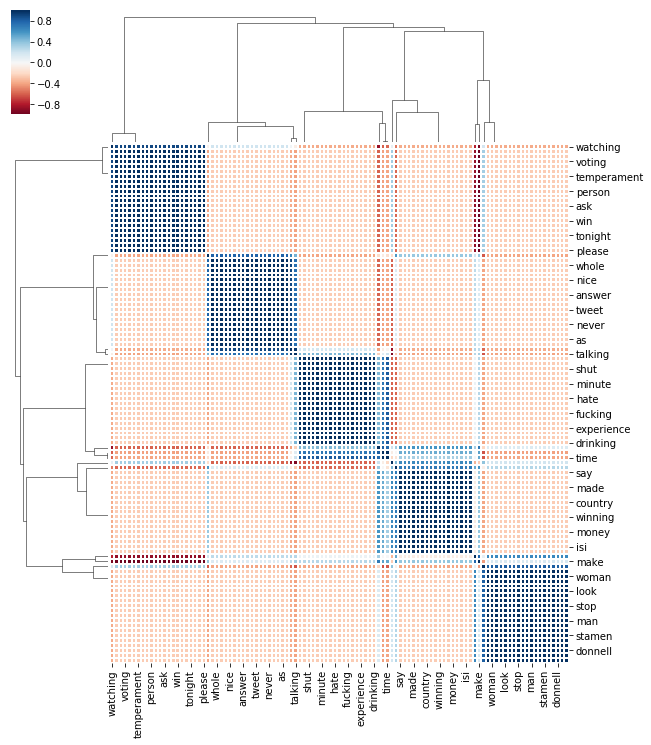

In [64]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

g=sns.clustermap(df_lda.corr(), center=0, cmap="RdBu", metric='cosine', linewidths=1, figsize=(10, 12))
plt.setp(g.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
plt.show()
#plt.setp(ax_heatmap.get_yticklabels(), rotation=0)  # For y axis

### Tweets pyLDAvis

In [65]:
import pyLDAvis.gensim

pyLDAvis.enable_notebook()
panel = pyLDAvis.gensim.prepare(lda, corpus, dictionary, mds='TSNE')
panel

PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
1       59.738613   84.024330       1        1  21.686279
2      180.455063   28.598993       2        1  21.471998
0       -6.859536 -126.562050       3        1  19.624603
4      113.066277  -80.694527       4        1  18.662209
3      -38.859016    2.358344       5        1  18.554911, topic_info=     Category         Freq          Term         Total  loglift  logprob
term                                                                    
1765  Default  4483.000000        stamen   4483.000000  30.0000  30.0000
22    Default  4600.000000           say   4600.000000  29.0000  29.0000
421   Default  4143.000000      question   4143.000000  28.0000  28.0000
1513  Default  3517.000000   temperament   3517.000000  27.0000  27.0000
480   Default  3464.000000        better   3464.000000  26.0000  26.0000
11    Default  2911.000000       country   2911.000000  25.0000  25.0000
197   Default  2576.000000          vote   2576.000000  24.0000  24.0000
569   Default  2216.000000          fact   2216.000000  23.0000  23.0000
621   Default  2516.000000          word   2516.000000  22.0000  22.0000
3353  Default  1958.000000    experience   1958.000000  21.0000  21.0000
14    Default  5532.000000          time   5532.000000  20.0000  20.0000
74    Default  1986.000000           man   1986.000000  19.0000  19.0000
27    Default  2070.000000       america   2070.000000  18.0000  18.0000
2926  Default  1996.000000           isi   1996.000000  17.0000  17.0000
154   Default  1820.000000          fuck   1820.000000  16.0000  16.0000
340   Default  1940.000000        answer   1940.000000  15.0000  15.0000
111   Default  2181.000000          shit   2181.000000  14.0000  14.0000
735   Default  3381.000000          talk   3381.000000  13.0000  13.0000
3437  Default  1652.000000           war   1652.000000  12.0000  12.0000
53    Default  2901.000000  presidential   2901.000000  11.0000  11.0000
262   Default  1734.000000          want   1734.000000  10.0000  10.0000
1071  Default  1569.000000         wrong   1569.000000   9.0000   9.0000
555   Default  1518.000000       getting   1518.000000   8.0000   8.0000
5855  Default  1506.000000       nuclear   1506.000000   7.0000   7.0000
746   Default  1921.000000          stop   1921.000000   6.0000   6.0000
78    Default  1643.000000         great   1643.000000   5.0000   5.0000
45    Default  1514.000000       support   1514.000000   4.0000   4.0000
97    Default  1494.000000     moderator   1494.000000   3.0000   3.0000
409   Default  1354.000000        minute   1354.000000   2.0000   2.0000
1650  Default  1649.000000         obama   1649.000000   1.0000   1.0000
...       ...          ...           ...           ...      ...      ...
254    Topic5   412.644806          drop    413.455841   1.6825  -5.7117
841    Topic5   389.435852       million    390.246033   1.6824  -5.7696
178    Topic5   374.003052           tho    374.802765   1.6823  -5.8100
423    Topic5   358.632446         worse    359.432281   1.6822  -5.8520
797    Topic5   342.708679         party    343.520782   1.6821  -5.8974
454    Topic5   336.890350        actual    337.689728   1.6821  -5.9145
1235   Topic5   335.698364        rather    336.496307   1.6821  -5.9181
186    Topic5   337.865845          miss    338.687927   1.6820  -5.9117
1227   Topic5   337.826294           son    338.662292   1.6820  -5.9118
1963   Topic5   318.449860        record    319.244995   1.6819  -5.9708
1248   Topic5   317.306213          holy    318.102692   1.6819  -5.9744
494    Topic5   781.940247        voting    785.644226   1.6797  -5.0725
107    Topic5   939.855408       thought    949.774231   1.6739  -4.8886
829    Topic5   515.037537         cause    518.162720   1.6784  -5.4901
383    Topic5   729.574158        either    737.601746   1.6735  -5.1418
480    Topic5  3133.398193        better   3464

### Tweets Debate Topic WordCloud

***

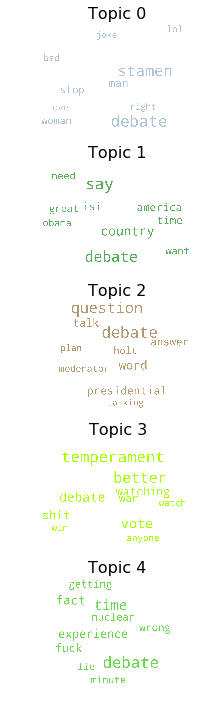

In [66]:
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.XKCD_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(background_color='white',
                  width=2000,
                  height=1400,
                  max_words=15,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = lda.show_topics(formatted=False)

fig, axes = plt.subplots(5, figsize=(10,10), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=200)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

### FastText Debate Word Embeddings 

In [67]:
from gensim.models import FastText
from sklearn.manifold import TSNE
from matplotlib import pyplot as plt

model = FastText(cleaned_tweets, size=100, window=50, min_count=500, workers=6)
# summarize the loaded model
print(model)
# summarize vocabulary
words = list(model.wv.vocab)

FastText(vocab=268, size=100, alpha=0.025)


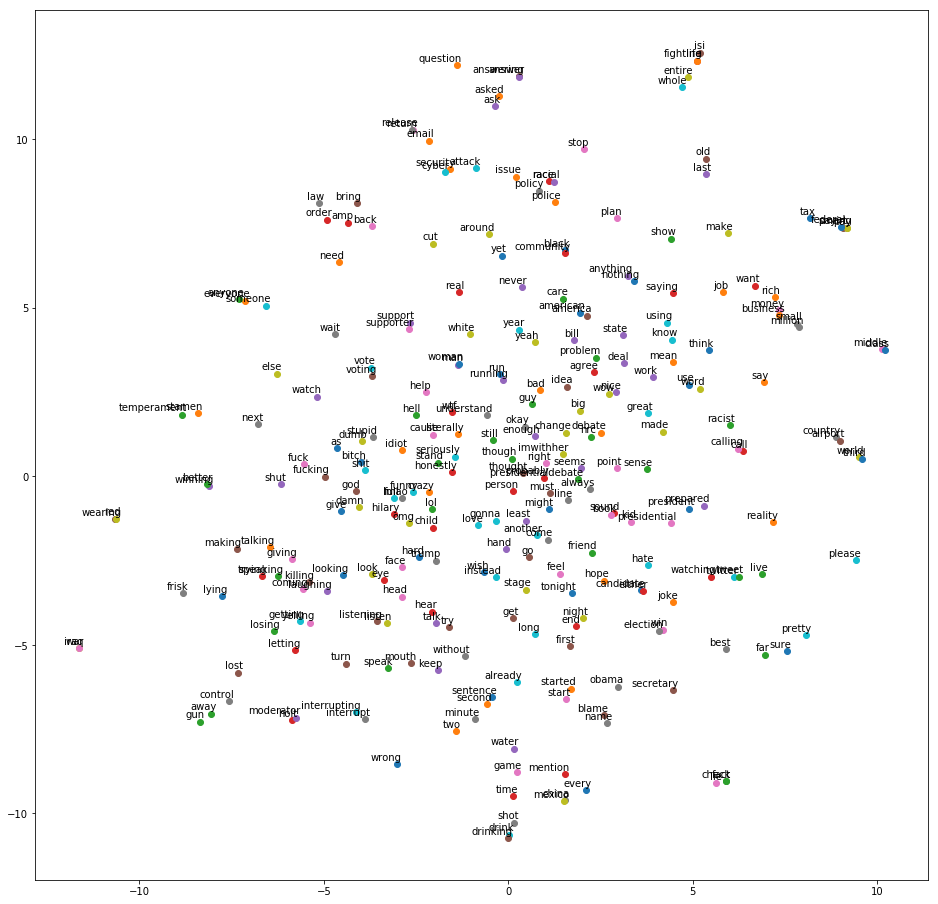

In [68]:
def tsne_plot(model):
    labels = []
    tokens = []

    for word in model.wv.vocab:
        tokens.append(model[word])
        labels.append(word)
    
    tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
    new_values = tsne_model.fit_transform(tokens)

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize=(16, 16)) 
    for i in range(len(x)):
        plt.scatter(x[i],y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(5, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()
tsne_plot(model)

<br>

## Debate & Tweets Segment Time Frames

In tweets segments, +5 sec from the end of the final sentence expressed by a candidate is given before moving to the next one 

- Achieving Prosperity: jobs creation, bringing back expatriated American manufacturers, tax policy.
- Candidates private scandals: Trump’s tax return release, Clinton’s e-mails scandal.
- America’s Direction: healing race relations, police bias, Trump’s questioning Obama’s birth certificate legitimacy.
- Securing America: national institutions cyber attacks, ISIS, homegrown terroristic attacks, Iraq War, nuclear weapons policy.
- Mutual Acceptance & Election Outcome: Trump’s opinion on Clinton’s public figure, acceptance of election outcome.
 ***

N.B. Before running this section, RUN AGAIN the ENTIRE time conversion section for obtain the original "new_tweets" dataframe having as index the TIME - otherwise these following codes will output list of strings with no tokens

### I° Segment, "Achieving Prosperity"

In [79]:
#define "Achieving Prosperity" segment
TW_I = new_tweet.loc['09:04:53':'09:31:23']
TW_I.reset_index(inplace= True)

In [80]:
TW_I_TIME = TW_I['TIME'] 

tweets_ratio_I = pd.to_datetime(TW_I_TIME, format='%X')

trace = go.Histogram(
    x=tweets_ratio_I,
    marker=dict(
        color='lightblue'
    ),
    opacity=0.75
)

layout = go.Layout(
    title='I. Achieving Prosperity',
    height=450,
    width=1200,
    xaxis=dict(
        title='Time Segment for each bar = 14sec'
    ),
    yaxis=dict(
        title='Tweet Volume'
    ),
    bargap=0.2,
)

data = [trace]

fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig)

In [81]:
tweets1 = list(TW_I.TEXT)

twtok1 = [
     [word for word in document.lower().split()]
      for document in tweets1
 ]

# remove words that appear only once
frequency = defaultdict(int)
for text in twtok1:
     for token in text:
        frequency[token] += 1
        
debtok = [
     [token for token in text if frequency[token] > 1]
     for text in twtok1
 ]

In [82]:
tweets = [list(filter(None, [re.sub(r'\b\w{1,2}\b','', x) for x in y])) for y in
       debtok]
tweets = [list(filter(None, [re.sub(r'\d+','', x) for x in y])) for y in
       tweets]
tweets = [list(filter(None, [re.sub(r'(@[A-Za-z0-9]+)','', x) for x in y])) for y in
       tweets]
tweets = [list(filter(None, [re.sub(r'[\.\,\'\"\!\?\:\;\-\_\/\=\(\)\|\*\@\#\$\"]+','', x) for x in y])) for y in
       tweets]
tweets = [list(filter(None, [re.sub(r'[^\x00-\x7F]+','', x) for x in y])) for y in
       tweets]
tweets = [list(filter(None, [re.sub(r'(.)\1{2,}',r'\1', x) for x in y])) for y in
       tweets]

lmtzr = WordNetLemmatizer()
stoplist = stopwords.words('english')
cleaned_tweets1 = [
     [lmtzr.lemmatize(word) for word in document if word not in stoplist1]
    for document in tweets
 ]

cleaned_tweets1

[['hold', 'as', 'hug', 'loved', 'one', 'tight', 'hope', 'hrc', 'take'],
 ['time', 'watch', 'destroy', 'secretary', 'close', 'back', 'country', 'yeah'],
 ['drink', 'every', 'time', 'say', 'huge', 'folk', 'presidentialdebate'],
 ['nasty', 'real', 'quick'],
 ['let'],
 ['hand', 'america', 'land', 'hand', 'kid', 'line', 'stage'],
 ['gonna', 'destroy', 'tonight', 'everyone', 'trumptrain'],
 ['month', 'since', 'rally', 'laugh', 'crowd'],
 ['lol', 'watching', 'parent', 'support', 'gonna', 'fun'],
 ['watching'],
 ['simpson', 'lisa', 'simpson', 'tonight'],
 ['gonna', 'interesting'],
 ['tune', 'first', 'presidential', 'tonight', 'crooked'],
 ['come', 'imwithher'],
 ['pretty', 'surreal', 'remember', 'american'],
 [],
 ['watching', 'via'],
 ['wizard', 'need', 'show', 'need', 'show', 'heart', 'news'],
 ['idk',
  'excited',
  'presidential',
  'saying',
  'man',
  'filter',
  'presidentialdebate'],
 ['drinking', 'game', 'shot', 'whenever', 'say', 'make', 'america', 'great'],
 ['switched', 'color', 'a

In [83]:
dictionary1 = corpora.Dictionary(cleaned_tweets1)

corpus1 = [dictionary1.doc2bow(text) for text in cleaned_tweets1]

In [84]:
total_topics = 3
lda = models.LdaModel(corpus1, id2word=dictionary1, num_topics=total_topics)

In [85]:
lda.show_topics(total_topics,10)

[(0,
  '0.030*"debate" + 0.020*"watching" + 0.013*"presidential" + 0.010*"talking" + 0.009*"life" + 0.009*"interrupt" + 0.009*"fucking" + 0.009*"lol" + 0.009*"look" + 0.008*"president"'),
 (1,
  '0.024*"time" + 0.014*"talk" + 0.013*"interrupting" + 0.013*"shut" + 0.013*"every" + 0.012*"watch" + 0.011*"getting" + 0.010*"make" + 0.009*"minute" + 0.009*"need"'),
 (2,
  '0.054*"debate" + 0.016*"isi" + 0.016*"fact" + 0.013*"tax" + 0.011*"need" + 0.011*"plan" + 0.010*"job" + 0.010*"fighting" + 0.008*"question" + 0.007*"bad"')]

<br>

### II° Segment, "Candidate Figure Issues"

In [87]:
#define "Candidate Figure Issues" segment
TW_II = new_tweet.loc['09:31:38':'09:43:41']
TW_II.reset_index(inplace= True)

In [88]:
TW_II_TIME = TW_II['TIME'] 

tweets_ratio_II = pd.to_datetime(TW_II_TIME, format='%X')

trace = go.Histogram(
    x=tweets_ratio_II,
    marker=dict(
        color='lightblue'
    ),
    opacity=0.75
)

layout = go.Layout(
    title='II. Candidate Figure Issues',
    height=450,
    width=1200,
    xaxis=dict(
        title='Time Segment for each bar = 9sec'
    ),
    yaxis=dict(
        title='Tweet Volume'
    ),
    bargap=0.2,
)

data = [trace]

fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig)

In [89]:
tweets2 = list(TW_II.TEXT)

twtok2 = [
     [word for word in document.lower().split()]
      for document in tweets2
 ]

# remove words that appear only once
frequency = defaultdict(int)
for text in twtok2:
     for token in text:
        frequency[token] += 1
        
debtok2 = [
     [token for token in text if frequency[token] > 1]
     for text in twtok2
 ]

tweets = [list(filter(None, [re.sub(r'\b\w{1,2}\b','', x) for x in y])) for y in
       debtok2]
tweets = [list(filter(None, [re.sub(r'\d+','', x) for x in y])) for y in
       tweets]
tweets = [list(filter(None, [re.sub(r'(@[A-Za-z0-9]+)','', x) for x in y])) for y in
       tweets]
tweets = [list(filter(None, [re.sub(r'[\.\,\'\"\!\?\:\;\_\-\/\=\(\)\|\*\@\&\#\$\"]+','', x) for x in y])) for y in
       tweets]
tweets = [list(filter(None, [re.sub(r'[^\x00-\x7F]+','', x) for x in y])) for y in
       tweets]
tweets = [list(filter(None, [re.sub(r'(.)\1{2,}',r'\1', x) for x in y])) for y in
       tweets]

lmtzr = WordNetLemmatizer()
cleaned_tweets2 = [
     [lmtzr.lemmatize(word) for word in document if word not in stoplist1]
    for document in tweets
 ]

cleaned_tweets2

[['apparently', 'need', 'economy'],
 ['debate', 'dominating', 'debate'],
 ['shook', 'head', 'hilary', 'lowering', 'debt', 'college', 'student', 'smh'],
 ['listening', 'moderator', 'time', 'hook'],
 ['blaming', 'sound', 'stupid'],
 ['nah', 'getting', 'sick'],
 ['look', 'old', 'divorced', 'couple', 'arguing', 'kid', 'never', 'debate'],
 [],
 ['defending',
  'saying',
  'hoped',
  'country',
  'recession',
  'buy',
  'saying',
  'business'],
 ['need', 'chill', 'minute', 'debate'],
 ['golf', 'course', 'play', 'golf'],
 ['come',
  'endless',
  'foreign',
  'war',
  'continue',
  'current',
  'war',
  'start',
  'one'],
 ['amp', 'two', 'drunk', 'friend', 'bar', 'arguing'],
 ['learned', 'isi', 'around', 'year'],
 ['boat', 'right'],
 ['want', 'stay', 'away', 'fact', 'issue', 'answer', 'minute'],
 ['yep', 'implies', 'le', 'net', 'worth', 'claim', 'response'],
 ['drinking', 'game', 'notice', 'water', 'struggling', 'amp', 'anger', 'amp'],
 ['day', 'political', 'guy', 'dumb'],
 ['anyone', 'yet', '

In [90]:
dictionary2 = corpora.Dictionary(cleaned_tweets2)
corpus2 = [dictionary2.doc2bow(text) for text in cleaned_tweets2]

In [91]:
total_topics = 3
lda2 = models.LdaModel(corpus2, id2word=dictionary2, num_topics=total_topics)

lda2.show_topics(total_topics,10)

[(0,
  '0.027*"country" + 0.024*"world" + 0.021*"time" + 0.019*"watching" + 0.015*"third" + 0.013*"airport" + 0.011*"every" + 0.008*"america" + 0.008*"need" + 0.008*"tonight"'),
 (1,
  '0.076*"debate" + 0.058*"tax" + 0.026*"pay" + 0.018*"paying" + 0.014*"make" + 0.014*"smart" + 0.012*"return" + 0.011*"federal" + 0.011*"business" + 0.011*"release"'),
 (2,
  '0.020*"email" + 0.016*"word" + 0.010*"lol" + 0.010*"man" + 0.009*"amp" + 0.009*"business" + 0.008*"watch" + 0.008*"rd" + 0.007*"saying" + 0.007*"bankruptcy"')]

### III° Segment, "America's Direction"

In [92]:
#define "America's direction" segment
TW_III = new_tweet.loc['09:44:06':'10:06:14']
TW_III.reset_index(inplace= True)

In [93]:
TW_III_TIME = TW_III['TIME'] 

tweets_ratio_III = pd.to_datetime(TW_III_TIME, format='%X')

trace = go.Histogram(
    x=tweets_ratio_III,
    marker=dict(
        color='lightblue'
    ),
    opacity=0.75
)

layout = go.Layout(
    title="III. America's Direction",
    height=450,
    width=1200,
    xaxis=dict(
        title='Time Segment for each bar = 14sec'
    ),
    yaxis=dict(
        title='Tweet Volume'
    ),
    bargap=0.2,
)

data = [trace]

fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig)

In [94]:
tweets3 = list(TW_III.TEXT)

twtok3 = [
     [word for word in document.lower().split()]
      for document in tweets3
 ]

# remove words that appear only once
frequency = defaultdict(int)
for text in twtok3:
     for token in text:
        frequency[token] += 1
        
debtok2 = [
     [token for token in text if frequency[token] > 1]
     for text in twtok3
 ]

tweets = [list(filter(None, [re.sub(r'\b\w{1,2}\b','', x) for x in y])) for y in
       debtok2]
tweets = [list(filter(None, [re.sub(r'\d+','', x) for x in y])) for y in
       tweets]
tweets = [list(filter(None, [re.sub(r'(@[A-Za-z0-9]+)','', x) for x in y])) for y in
       tweets]
tweets = [list(filter(None, [re.sub(r'[\.\,\'\"\!\?\:\;\-\_\/\=\(\)\|\*\&\@\#\$\"]+','', x) for x in y])) for y in
       tweets]
tweets = [list(filter(None, [re.sub(r'[^\x00-\x7F]+','', x) for x in y])) for y in
       tweets]
tweets = [list(filter(None, [re.sub(r'(.)\1{2,}',r'\1', x) for x in y])) for y in
       tweets]

lmtzr = WordNetLemmatizer()
cleaned_tweets3 = [
     [lmtzr.lemmatize(word) for word in document if word not in stoplist1]
    for document in tweets
 ]

cleaned_tweets3

[['us', 'word', 'unbelievable', 'greatest', 'describe', 'next', 'sentence'],
 ['turned', 'came', 'running', 'top', 'lung'],
 ['first', 'presidential'],
 ['campaign', 'expense', 'destroy', 'economy'],
 ['snap', 'story', 'watching', 'watching', 'jesus', 'christ'],
 ['narcissistic', 'plain', 'awful', 'nevertrump'],
 ['audience', 'agree', 'bigly', 'onevote'],
 ['sound', 'house', 'wife', 'debate'],
 ['literally', 'pull', 'rebuttal', 'point', 'as'],
 ['bigot', 'love', 'gay', 'black'],
 ['twitter', 'debate', 'epitome', 'exact', 'kind', 'wanted', 'jail', 'back'],
 ['irritated', 'beat', 'answer', 'question'],
 ['interact'],
 ['watching'],
 ['playing', 'drinking', 'game', 'stop'],
 ['say', 'idea'],
 ['hella', 'cry'],
 ['wheres', 'need', 'impromptu', 'fuck'],
 ['advantage',
  'law',
  'nation',
  'speaking',
  'paying',
  'tax',
  'contractor',
  'big',
  'hit',
  'hrc'],
 ['snort', 'coke', 'sniffing'],
 ['pnpcbc',
  'worth',
  'noting',
  'secretary',
  'lobbied',
  'transition',
  'medicare',
 

In [95]:
dictionary3 = corpora.Dictionary(cleaned_tweets3)
corpus3 = [dictionary3.doc2bow(text) for text in cleaned_tweets3]

In [96]:
total_topics = 3
lda3 = models.LdaModel(corpus3, id2word=dictionary3, num_topics=total_topics)

lda3.show_topics(total_topics,10)

[(0,
  '0.026*"debate" + 0.017*"right" + 0.016*"birther" + 0.013*"gun" + 0.008*"racist" + 0.008*"shit" + 0.008*"fact" + 0.007*"make" + 0.007*"amp" + 0.006*"fuck"'),
 (1,
  '0.037*"debate" + 0.019*"question" + 0.015*"stop" + 0.014*"president" + 0.014*"prepared" + 0.013*"racist" + 0.012*"black" + 0.012*"answer" + 0.011*"frisk" + 0.009*"need"'),
 (2,
  '0.029*"obama" + 0.024*"debate" + 0.014*"birth" + 0.014*"watching" + 0.013*"american" + 0.012*"certificate" + 0.012*"time" + 0.009*"president" + 0.009*"black" + 0.009*"african"')]

### IV° Segment, "Securing America"

In [97]:
#define "Securing America" segment
TW_IV = new_tweet.loc['10:06:26':'10:33:00']
TW_IV.reset_index(inplace= True)

In [98]:
TW_IV_TIME = TW_IV['TIME'] 

tweets_ratio_IV = pd.to_datetime(TW_IV_TIME, format='%X')

trace = go.Histogram(
    x=tweets_ratio_IV,
    marker=dict(
        color='lightblue'
    ),
    opacity=0.75
)

layout = go.Layout(
    title='IV. Securing America',
    height=450,
    width=1200,
    xaxis=dict(
        title='Time Segment for each bar = 14sec'
    ),
    yaxis=dict(
        title='Tweet Volume'
    ),
    bargap=0.2,
)

data = [trace]

fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig)

In [99]:
tweets4 = list(TW_IV.TEXT)

twtok4 = [
     [word for word in document.lower().split()]
      for document in tweets4
 ]

# remove words that appear only once
frequency = defaultdict(int)
for text in twtok4:
     for token in text:
        frequency[token] += 1
        
debtok4 = [
     [token for token in text if frequency[token] > 1]
     for text in twtok4
 ]

tweets = [list(filter(None, [re.sub(r'\b\w{1,2}\b','', x) for x in y])) for y in
       debtok4]
tweets = [list(filter(None, [re.sub(r'\d+','', x) for x in y])) for y in
       tweets]
tweets = [list(filter(None, [re.sub(r'(@[A-Za-z0-9]+)','', x) for x in y])) for y in
       tweets]
tweets = [list(filter(None, [re.sub(r'[\.\,\'\"\!\?\:\;\-\_\/\=\(\)\|\*\&\@\#\$\"]+','', x) for x in y])) for y in
       tweets]
tweets = [list(filter(None, [re.sub(r'[^\x00-\x7F]+','', x) for x in y])) for y in
       tweets]
tweets = [list(filter(None, [re.sub(r'(.)\1{2,}',r'\1', x) for x in y])) for y in
       tweets]

lmtzr = WordNetLemmatizer()
cleaned_tweets4 = [
     [lmtzr.lemmatize(word) for word in document if word not in stoplist1]
    for document in tweets
 ]

cleaned_tweets4

[['please', 'allow', 'blow'],
 ['love', 'petty', 'jab', 'fly', 'ear'],
 ['break', 'blow', 'nose', 'donaldsniffles', 'debate'],
 ['break', 'blow', 'nose', 'donaldsniffles', 'debate'],
 ['note', 'housing', 'discrimination', 'part'],
 ['mansplaining', 'totally', 'ridiculous', 'debate'],
 ['mansplaining', 'totally', 'ridiculous', 'debate'],
 ['getting', 'sued', 'racial', 'discrimination', 'absolutely', 'fuck'],
 ['whole'],
 ['basically', 'steel', 'cage', 'repeat'],
 ['cmon'],
 ['still',
  'disappointed',
  'crazy',
  'history',
  'made',
  'watching',
  'strong',
  'female',
  'presidency'],
 ['say', 'anything', 'else', 'business'],
 ['say', 'anything', 'else', 'business'],
 ['say', 'anything', 'else', 'business'],
 ['night', 'watching', 'presidentialdebate'],
 ['putting', 'defensive', 'come'],
 ['know', 'short', 'answer', 'right'],
 ['every', 'sentence', 'talk', 'money', 'least', 'debate'],
 ['bragging', 'business', 'accomplishment', 'place'],
 ['never', 'admits', 'guilt', 'wrong'],
 ['bi

In [100]:
dictionary4 = corpora.Dictionary(cleaned_tweets4)
corpus4 = [dictionary4.doc2bow(text) for text in cleaned_tweets4]

In [101]:
total_topics = 3
lda4 = models.LdaModel(corpus4, id2word=dictionary4, num_topics=total_topics)

lda4.show_topics(total_topics,10)

[(0,
  '0.020*"debate" + 0.015*"time" + 0.013*"nuclear" + 0.013*"question" + 0.011*"watching" + 0.009*"talking" + 0.009*"every" + 0.009*"talk" + 0.009*"war" + 0.008*"keep"'),
 (1,
  '0.037*"debate" + 0.015*"vote" + 0.010*"fact" + 0.009*"watch" + 0.008*"matter" + 0.008*"iran" + 0.008*"deal" + 0.007*"show" + 0.007*"presidential" + 0.007*"twitter"'),
 (2,
  '0.031*"debate" + 0.021*"temperament" + 0.020*"president" + 0.018*"better" + 0.011*"plan" + 0.011*"word" + 0.010*"say" + 0.009*"need" + 0.009*"china" + 0.008*"country"')]

### V° Segment, "Mutual & Election Acceptance"

In [102]:
#define "Mutual and Election Acceptance"
TW_V = new_tweet.loc['10:33:04':'10:38:56']
TW_V.reset_index(inplace= True)

In [103]:
TW_V_TIME = TW_V['TIME'] 

tweets_ratio_V = pd.to_datetime(TW_V_TIME, format='%X')

trace = go.Histogram(
    x=tweets_ratio_V,
    marker=dict(
        color='lightblue'
    ),
    opacity=0.75
)

layout = go.Layout(
    title='V. Mutual and Election Acceptance',
    height=450,
    width=1200,
    xaxis=dict(
        title='Time Segment for each bar = 9sec'
    ),
    yaxis=dict(
        title='Tweet Volume'
    ),
    bargap=0.2,
)

data = [trace]

fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig)

In [104]:
tweets5 = list(TW_V.TEXT)

twtok5 = [
     [word for word in document.lower().split()]
      for document in tweets5
 ]

# remove words that appear only once
frequency = defaultdict(int)
for text in twtok5:
     for token in text:
        frequency[token] += 1
        
debtok5 = [
     [token for token in text if frequency[token] > 1]
     for text in twtok5
 ]

tweets = [list(filter(None, [re.sub(r'\b\w{1,2}\b','', x) for x in y])) for y in
       debtok5]
tweets = [list(filter(None, [re.sub(r'\d+','', x) for x in y])) for y in
       tweets]
tweets = [list(filter(None, [re.sub(r'(@[A-Za-z0-9]+)','', x) for x in y])) for y in
       tweets]
tweets = [list(filter(None, [re.sub(r'[\.\,\'\"\!\?\:\;\-\_\/\=\(\)\|\*\@\#\$\"]+','', x) for x in y])) for y in
       tweets]
tweets = [list(filter(None, [re.sub(r'[^\x00-\x7F]+','', x) for x in y])) for y in
       tweets]
tweets = [list(filter(None, [re.sub(r'(.)\1{2,}',r'\1', x) for x in y])) for y in
       tweets]

lmtzr = WordNetLemmatizer()
cleaned_tweets5 = [
     [lmtzr.lemmatize(word) for word in document if word not in stoplist]
    for document in tweets
 ]

cleaned_tweets5

[['donald', 'trump', 'deserves', 'slapped', 'mouth'],
 ['moderator',
  'keep',
  'cutting',
  'hillary',
  'yet',
  'much',
  'wee',
  'orange',
  'one'],
 ['biggest', 'lie', 'told', 'trump', 'tonight', 'debatenight'],
 ['debate', 'minute', 'ago'],
 ['lester',
  'trump',
  'working',
  'together',
  'let',
  'hillary',
  'talk',
  'really',
  'thinking',
  'need',
  'lean',
  'interrupt',
  'debate',
  'debate'],
 ['trump', 'right', 'usa', 'cannot', 'world', 'peace'],
 ['know', 'presidential', 'debate', 'comedy', 'central'],
 ['let', 'trump', 'omg'],
 ['trump', 'blaming', 'hilary', 'creating', 'isi'],
 ['clinton', 'address', 'cybersecurity', 'joke'],
 ['debatenight',
  'count',
  'hillary',
  'like',
  'helped',
  'benghazi',
  'dead',
  'safe',
  'place',
  'counting',
  'foreign'],
 ['trump', 'dont', 'stop', 'talking', 'hillary', 'sound', 'dumb'],
 ['bad',
  'need',
  'anybody',
  'work',
  'know',
  'shitty',
  'tax',
  'hillary',
  'gonna',
  'bring'],
 ['trump', 'first', 'half', '

In [105]:
dictionary5 = corpora.Dictionary(cleaned_tweets5)
corpus5 = [dictionary5.doc2bow(text) for text in cleaned_tweets5]

In [106]:
total_topics = 2
lda5 = models.LdaModel(corpus5, id2word=dictionary5, num_topics=total_topics)

lda5.show_topics(total_topics,10)

[(0,
  '0.102*"trump" + 0.062*"debate" + 0.034*"debatenight" + 0.033*"donald" + 0.016*"say" + 0.012*"hillary" + 0.012*"question" + 0.008*"think" + 0.008*"clinton" + 0.008*"lester"'),
 (1,
  '0.087*"hillary" + 0.066*"trump" + 0.030*"debate" + 0.022*"debatenight" + 0.021*"clinton" + 0.016*"like" + 0.011*"woman" + 0.011*"said" + 0.011*"nice" + 0.010*"donald"')]